<a href="https://colab.research.google.com/github/19A81A0487/Computer-vision/blob/main/image_classsification(tf).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras

from tensorflow.keras import layers

#paths

In [12]:
data_train_path = "/content/drive/MyDrive/Fruits_Vegetables/train"
data_test_path = "/content/drive/MyDrive/Fruits_Vegetables/test"
data_val_path = "/content/drive/MyDrive/Fruits_Vegetables/validation"



#size

In [13]:
img_width = 224
img_heights = 224

#train_data

In [17]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_train_path,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_width,img_heights),
  batch_size=32
)

Found 3115 files belonging to 36 classes.
Using 2492 files for training.


#test_data

In [31]:
test_ds = tf.keras.utils.image_dataset_from_directory(
  data_test_path,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_width,img_heights),
  batch_size=32
)

Found 359 files belonging to 36 classes.
Using 288 files for training.


#val_data

In [32]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_val_path,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_width,img_heights),
  batch_size=32
)

Found 351 files belonging to 36 classes.
Using 281 files for training.


#class names

In [22]:
class_names = train_ds.class_names
class_names

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

#printing 10 images

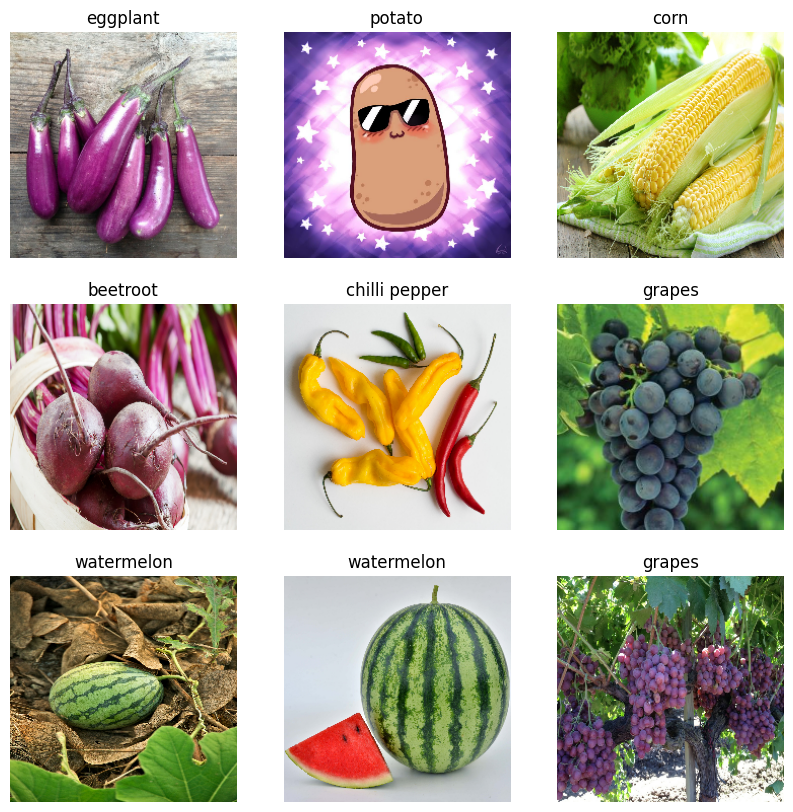

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

#train the model

Epoch 1/10
9/9 [==============================] - 84s 9s/step - loss: 288.3870 - accuracy: 0.0320 - val_loss: 3.3972 - val_accuracy: 0.1068
Epoch 2/10
9/9 [==============================] - 41s 5s/step - loss: 3.3914 - accuracy: 0.0854 - val_loss: 2.7324 - val_accuracy: 0.4342
Epoch 3/10
9/9 [==============================] - 46s 5s/step - loss: 2.1239 - accuracy: 0.5089 - val_loss: 1.7636 - val_accuracy: 0.6228
Epoch 4/10
9/9 [==============================] - 42s 5s/step - loss: 1.7459 - accuracy: 0.6299 - val_loss: 0.7733 - val_accuracy: 0.8577
Epoch 5/10
9/9 [==============================] - 43s 5s/step - loss: 0.8190 - accuracy: 0.8399 - val_loss: 0.5663 - val_accuracy: 0.9181
Epoch 6/10
9/9 [==============================] - 42s 5s/step - loss: 0.7996 - accuracy: 0.8932 - val_loss: 0.5094 - val_accuracy: 0.9217
Epoch 7/10
9/9 [==============================] - 52s 6s/step - loss: 0.4723 - accuracy: 0.9253 - val_loss: 0.3663 - val_accuracy: 0.9431
Epoch 8/10
9/9 [================

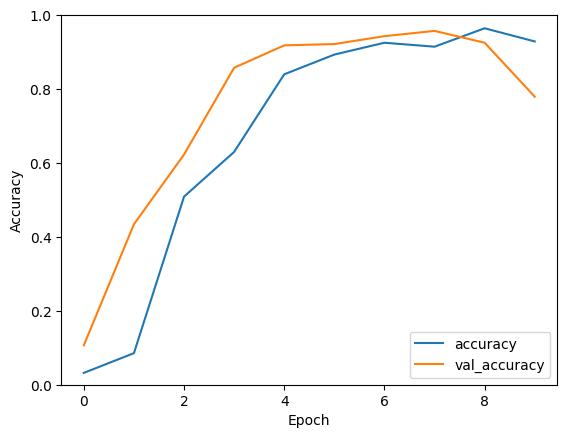

In [40]:
import tensorflow as tf


model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_heights, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(len(class_names))
])


model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


history = model.fit(train_ds, validation_data=val_ds, epochs=10)


test_loss, test_acc = model.evaluate(test_ds)
print("Test accuracy:", test_acc)


plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()




#prediction and accuracy

1/1 [==============================] - 0s 217ms/step


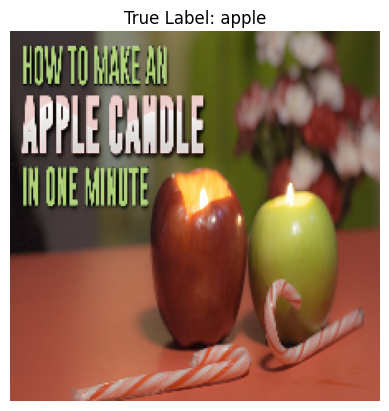

1/1 [==============================] - 0s 47ms/step


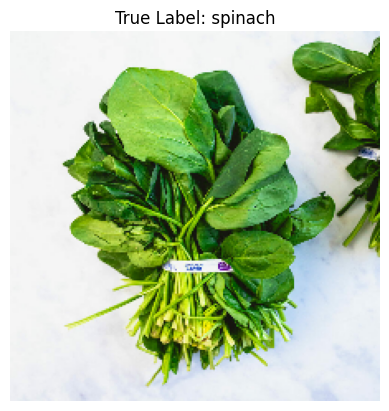

1/1 [==============================] - 0s 66ms/step


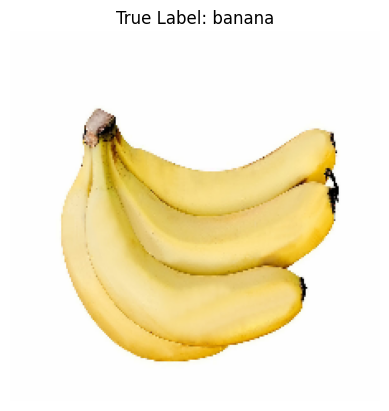

1/1 [==============================] - 0s 48ms/step


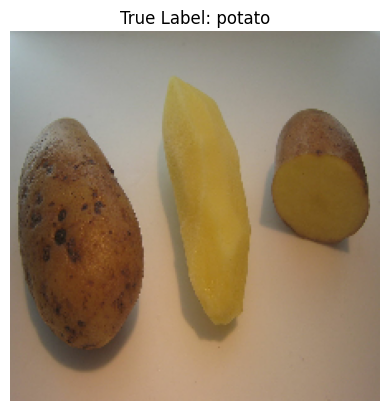

1/1 [==============================] - 0s 48ms/step


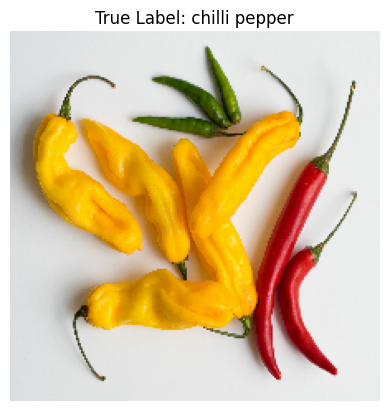

1/1 [==============================] - 0s 49ms/step


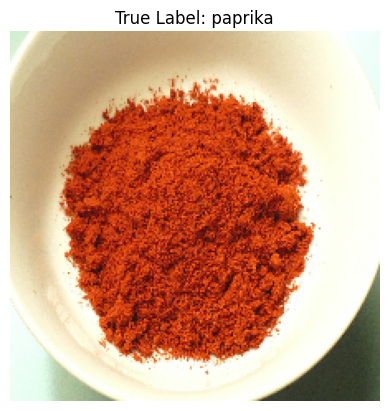

1/1 [==============================] - 0s 48ms/step


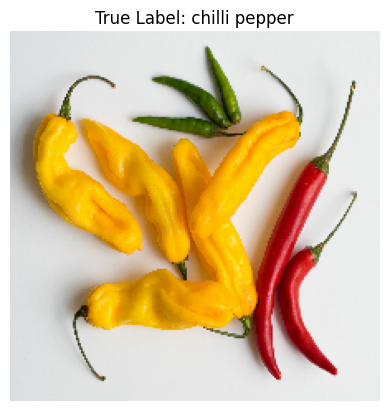

1/1 [==============================] - 0s 47ms/step


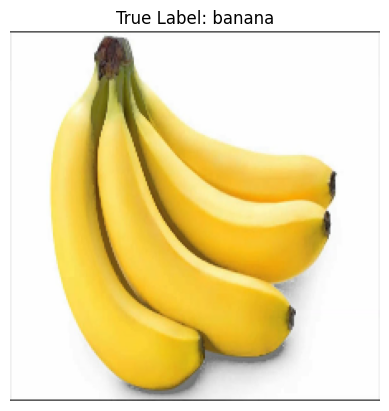

1/1 [==============================] - 0s 54ms/step


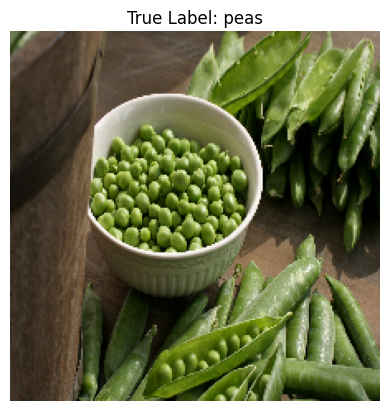

1/1 [==============================] - 0s 48ms/step


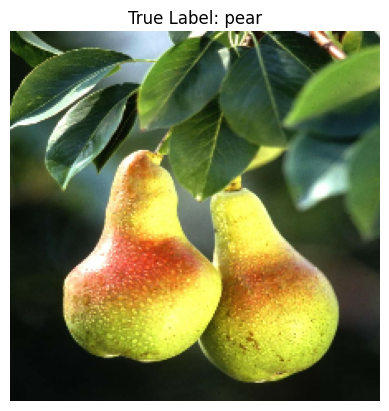

1/1 [==============================] - 0s 55ms/step


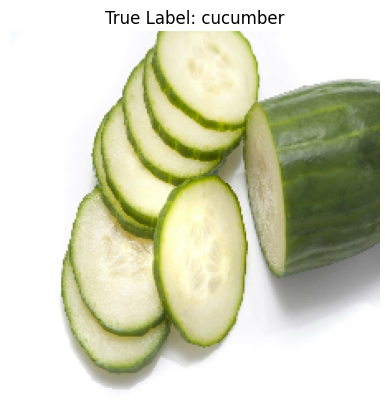

1/1 [==============================] - 0s 47ms/step


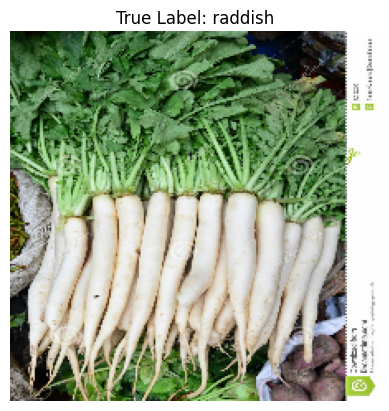

1/1 [==============================] - 0s 52ms/step


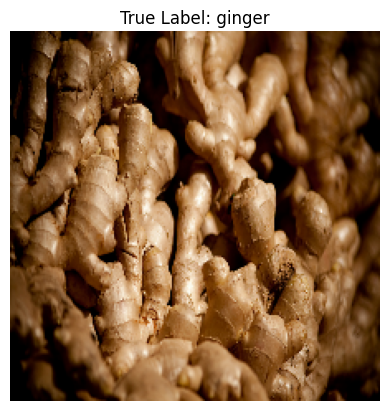

1/1 [==============================] - 0s 52ms/step


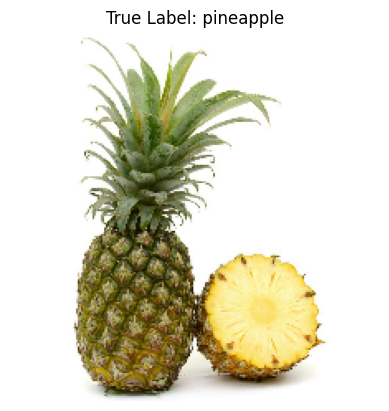

1/1 [==============================] - 0s 48ms/step


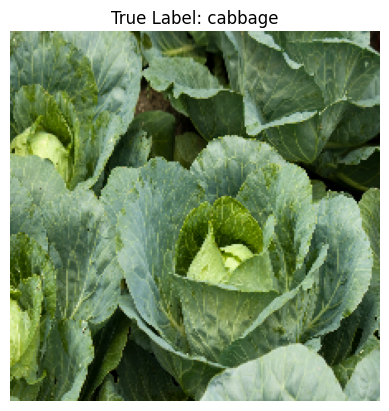

1/1 [==============================] - 0s 57ms/step


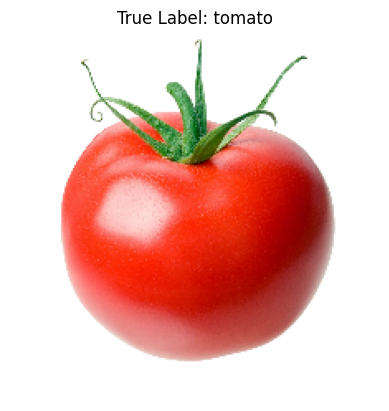

1/1 [==============================] - 0s 49ms/step


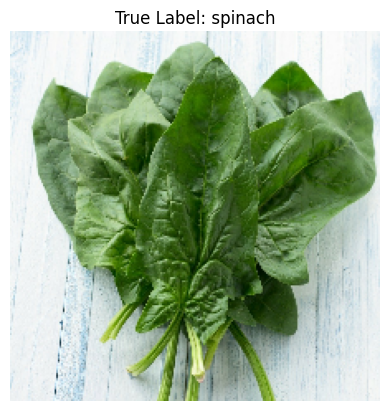

1/1 [==============================] - 0s 57ms/step


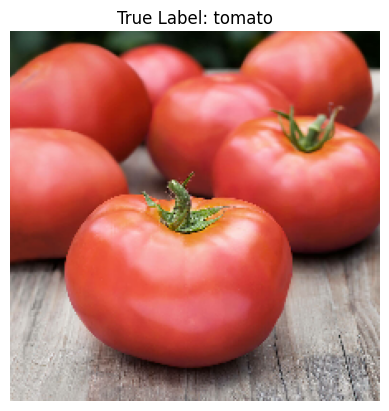

1/1 [==============================] - 0s 51ms/step


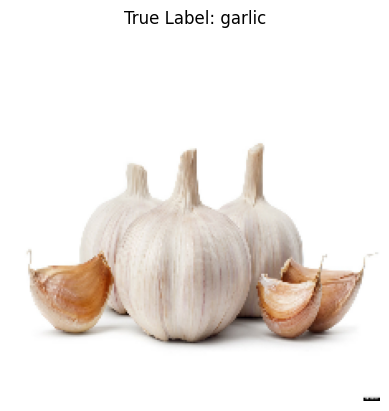

1/1 [==============================] - 0s 82ms/step


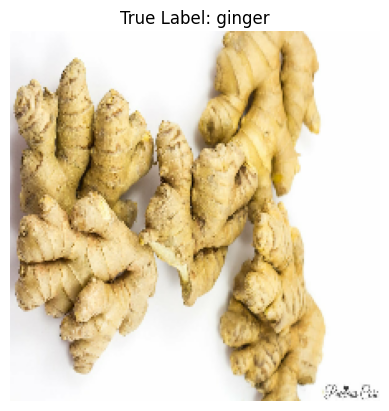

1/1 [==============================] - 0s 54ms/step


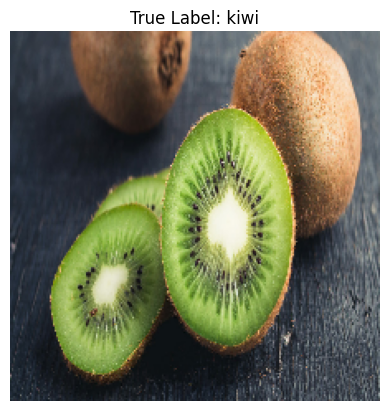

1/1 [==============================] - 0s 56ms/step


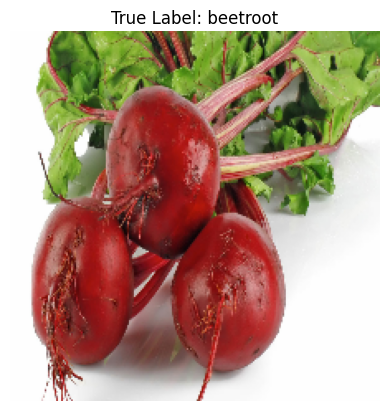

1/1 [==============================] - 0s 56ms/step


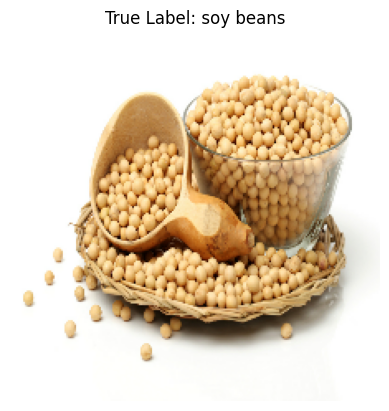

1/1 [==============================] - 0s 59ms/step


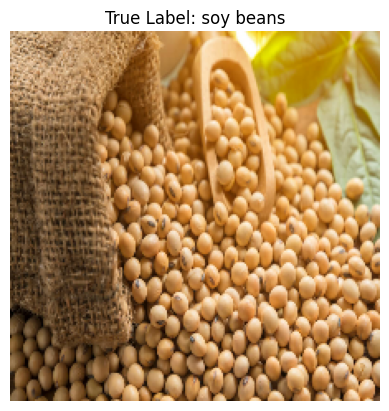

1/1 [==============================] - 0s 85ms/step


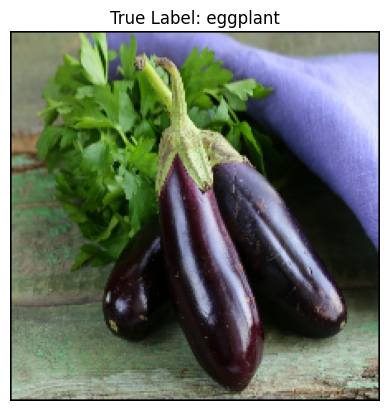

1/1 [==============================] - 0s 66ms/step


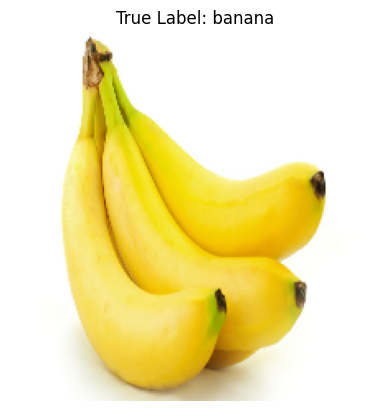

1/1 [==============================] - 0s 100ms/step


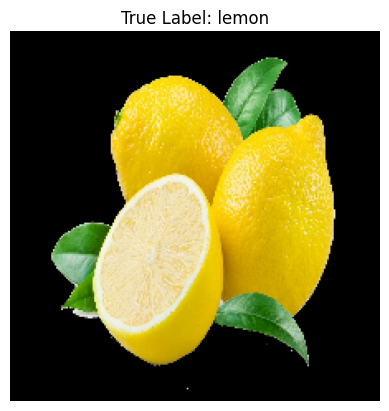

1/1 [==============================] - 0s 91ms/step


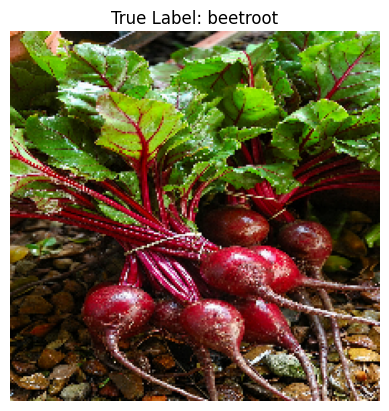

1/1 [==============================] - 0s 118ms/step


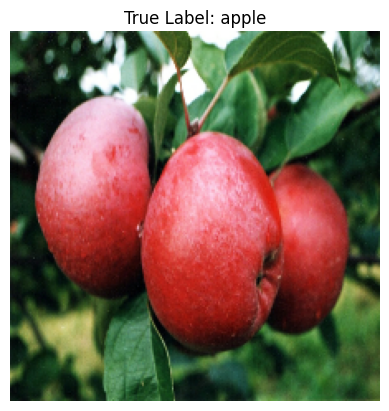

1/1 [==============================] - 0s 96ms/step


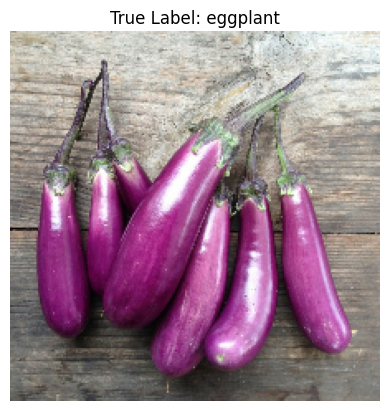

1/1 [==============================] - 0s 132ms/step


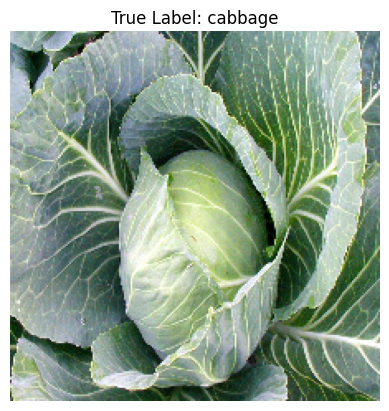

1/1 [==============================] - 0s 111ms/step


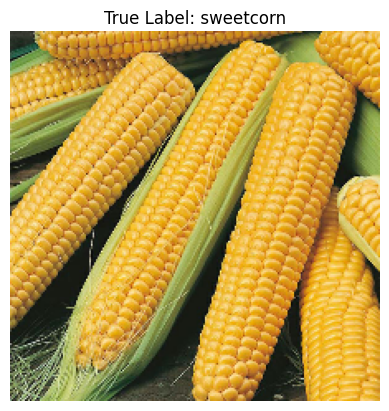

In [41]:
import numpy as np


def predict_image(model, class_names, img):
    img = np.expand_dims(img, axis=0)
    predictions = model.predict(img)
    predicted_class_index = np.argmax(predictions)
    predicted_class_name = class_names[predicted_class_index]
    confidence_score = np.max(predictions)
    return predicted_class_name, confidence_score

def show_image_prediction(image, label, model, class_names):
    plt.figure()
    plt.imshow(image)
    plt.title(f"True Label: {class_names[label]}")
    predicted_class, confidence = predict_image(model, class_names, image)
    plt.xlabel(f"Predicted: {predicted_class} ({confidence * 100:.2f}%)")
    plt.axis('off')
    plt.show()


for images, labels in test_ds.take(1):
    for i in range(len(images)):
        show_image_prediction(images[i].numpy().astype("uint8"), labels[i], model, class_names)
